In [1]:
import pandas as pd
import numpy as np

In [2]:
df = pd.read_csv("train.mnist.csv")

In [3]:
df.shape

(42000, 785)

In [4]:
df.sample()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
2136,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [5]:
import matplotlib.pyplot as plt

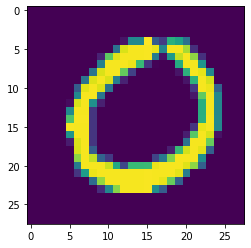

In [6]:
plt.imshow(df.iloc[19512,1:].values.reshape(28,28))

In [7]:
x = df.iloc[:,1:]
y = df.iloc[:,0]

In [8]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [9]:
x_train.shape

(33600, 784)

In [10]:
from sklearn.neighbors import KNeighborsClassifier

In [11]:
knn = KNeighborsClassifier()

In [12]:
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [14]:
import time
start=time.time()

In [15]:
y_pred = knn.predict(x_test)

In [16]:
print(time.time() - start)

33.56459379196167


In [17]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9648809523809524

In [18]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [19]:
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [20]:
#pca

In [21]:
from sklearn.decomposition import PCA
pca = PCA(n_components=100)

In [22]:
x_train_trf = pca.fit_transform(x_train)
x_test_trf = pca.transform(x_test)

In [23]:
x_train_trf.shape

(33600, 100)

In [24]:
knn = KNeighborsClassifier()

In [25]:
knn.fit(x_train_trf,y_train)

KNeighborsClassifier()

In [27]:
y_pred = knn.predict(x_test_trf)

In [28]:
accuracy_score(y_test,y_pred)

0.9547619047619048

In [ ]:
for i in range(1,785):
    pca = PCA(n_components=i)
    x_train_trf = pca.fit_transform(x_train)

In [29]:
pca = PCA(n_components=2)
x_train_trf = pca.fit_transform(x_train)
x_test_trf = pca.transform(x_test)

In [30]:
x_train_trf

array([[-2.71861473, -0.48971745],
       [-0.67696767, -6.75355256],
       [-3.03325242,  6.50982529],
       ...,
       [ 2.14882154,  0.78073591],
       [ 1.0595747 ,  0.94761947],
       [17.70259542,  1.96191171]])

In [31]:
x_train_trf.shape

(33600, 2)

In [33]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter(x=x_train_trf[:,0],
                y=x_train_trf[:,1],
                color = y_train_trf,
                color_discrete_sequence=px.colors.qualitative.G10
                )
fig.show()

In [37]:
pca = PCA(n_components=3)
x_train_trf = pca.fit_transform(x_train)
x_test_trf = pca.transform(x_test)

In [38]:
x_train_trf

array([[-2.71860413, -0.48979256,  1.13631821],
       [-0.67697136, -6.75368877, -2.33585297],
       [-3.03326494,  6.50965471,  7.49126496],
       ...,
       [ 2.14878035,  0.78070943, -0.74930298],
       [ 1.05961506,  0.94768914,  3.95097091],
       [17.70264323,  1.96149006, -4.94168522]])

In [40]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x=x_train_trf[:,0], y = x_train_trf[:,1], z = x_train_trf[:,2],
                   color = y_train_trf)
fig.update_layout(
    margin=dict(l=20,r=20,t=20,b=20),
    paper_bgcolor="LightsteelBlue",
)
fig.show()

In [42]:
pca.explained_variance_

array([40.67111198, 29.17023395, 26.7445955 ])

In [43]:
pca.explained_variance_ratio_

array([0.05785192, 0.0414927 , 0.03804239])

In [45]:
pca = PCA(n_components=None)
x_train_trf = pca.fit_transform(x_train)
x_test_trf = pca.transform(x_test)

In [46]:
pca.explained_variance_.shape

(784,)

In [47]:
pca.components_.shape

(784, 784)

In [48]:
np.cumsum(pca.explained_variance_ratio_)

array([0.05785192, 0.09934462, 0.13738701, 0.16704964, 0.19286525,
       0.21541506, 0.23514574, 0.25289854, 0.26858504, 0.28294568,
       0.29664822, 0.30892077, 0.32038989, 0.33162017, 0.34220546,
       0.35240477, 0.36198153, 0.37140862, 0.38053351, 0.38943521,
       0.39783462, 0.40603525, 0.41388828, 0.42145568, 0.42882829,
       0.43584714, 0.44282633, 0.44953738, 0.45593583, 0.4622392 ,
       0.46839271, 0.4744166 , 0.48025334, 0.48603881, 0.49176214,
       0.49722614, 0.50265822, 0.50793994, 0.51307376, 0.51801392,
       0.52289063, 0.52771041, 0.53239246, 0.53698588, 0.54156249,
       0.54605468, 0.5505015 , 0.55491691, 0.55926803, 0.56358836,
       0.56780645, 0.57198888, 0.57606882, 0.58008887, 0.58407223,
       0.58801822, 0.59188694, 0.59571889, 0.59948441, 0.60322635,
       0.60687487, 0.6104829 , 0.61402176, 0.61750117, 0.62094441,
       0.62432378, 0.62767368, 0.63099377, 0.63426257, 0.63746765,
       0.64065542, 0.64376931, 0.64686564, 0.64992395, 0.65296

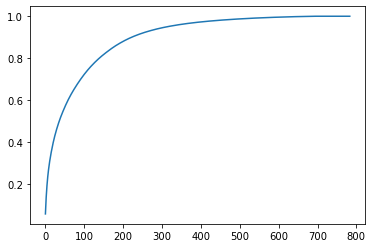

In [49]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))